(section:leiden-clustering)=
# Leiden clustering

#### A quick introduction to Leiden clustering...

The Leiden algorithm is a clustering method that is an improved version of the Louvain algorithm. It aims to identify cohesive groups or clusters within a larger network by optimizing the network's modularity, which measures the strength of division into communities. 

The Leiden algorithm computes a clustering on a KNN graph obtained from the PC reduced expression space. It starts by assigning each node in the network to its own cluster, which forms the initial partition. It then iterates through each node, considering moving it to a neighbouring cluster to see if it improves the network's modularity. This process continues until no further improvements can be made, resulting in a refined partition of the network where nodes in the same cluster are more connected to each other than to nodes in other clusters.

What sets Leiden apart is its ability to efficiently handle large networks, using a refinement step that avoids exhaustive exploration of all possible node movements. Instead, it focuses on relevant changes that enhance modularity. The Leiden module has a resolution parameter which allows to determine the scale of the partition cluster and therefore the coarseness of the clustering. A higher resolution parameter leads to more clusters.

In [1]:
import pandas as pd
import numpy as np

from pathlib import Path
import utils

# dimensionality reduction
from sklearn.decomposition import PCA
from umap import umap_ as UMAP

# plotting
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.offline as pyo
pyo.init_notebook_mode()

# clustering
from leiden_clustering import LeidenClustering

# statistics
from scipy.stats import ttest_ind

## Data loading and pre-processing

In [2]:
DATA_PATH = Path.cwd() / "../data"
FIG_PATH = Path.cwd() / "../src"
FILTER_TIMEOUT = True
if FILTER_TIMEOUT:
    FIG_PATH = FIG_PATH / "figures/leiden/"
else:
    FIG_PATH = FIG_PATH / "figures/leiden_with_timeout/"
FIG_PATH = FIG_PATH.resolve()
print(f"Figure path: {FIG_PATH}")
data = {
    Path(f).stem: pd.read_csv(f, index_col=0) for f in DATA_PATH.glob("combined_*.csv")
}
print(list(data.keys()))
if not FIG_PATH.exists():
    FIG_PATH.mkdir(parents=True)

Figure path: D:\ADA\ada-2023-project-adamants\src\figures\leiden
['combined_metrics_finished_edges', 'combined_metrics_finished_paths', 'combined_metrics_unfinished_edges', 'combined_metrics_unfinished_paths']


In [3]:
features_finished_paths = data["combined_metrics_finished_paths"].reset_index(drop=True)
features_unfinished_paths = data["combined_metrics_unfinished_paths"].reset_index(
    drop=True
)

Let's filter the timeout for this time... In the notebook leiden clustering with timeout you will see that it only adds a cluster containing all the timeout, but it shifts the means of all the features that use the time, reason why we remove them

In [4]:
if FILTER_TIMEOUT:
    features_unfinished_paths = features_unfinished_paths[
        features_unfinished_paths["type"] != "timeout"
    ]

In [5]:
combined_df = pd.concat([features_finished_paths, features_unfinished_paths], axis=0)
combined_df["finished"] = [1] * len(features_finished_paths) + [0] * len(
    features_unfinished_paths
)
combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING] = utils.normalize_features(
    combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING]
)

In [6]:
combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING].isna().sum()

durationInSec             0
backtrack                 0
numberOfPath              3
position_mean             0
position_std              0
path_length               0
coarse_mean_time          0
semantic_similarity       0
ratio                     0
path_closeness_abs_sum    0
dtype: int64

In [7]:
combined_df.dropna(subset=utils.FEATURES_COLS_USED_FOR_CLUSTERING, inplace=True)
X = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING].copy().values

In [8]:
combined_df

,hashedIpAddress,timestamp,durationInSec,path,rating,backtrack,numberOfPath,path_length,coarse_mean_time,position_mean,...,semantic_similarity,path_degree_abs_sum,path_clustering_abs_sum,path_degree_centrality_abs_sum,path_betweenness_abs_sum,path_closeness_abs_sum,index,target,type,finished
0,6a3701d319fc3754,2011-02-15 03:26:49,0.450421,"['14th_century', '15th_century', '16th_century...",NaN,-0.292447,-0.397854,1.246512,-0.037357,0.012312,...,1.896769,5.197422,-3.233355,-3.234431,-5.004633,-4.342440e-01,NaN,NaN,NaN,1
1,3824310e536af032,2012-08-12 06:36:52,-0.246765,"['14th_century', 'Europe', 'Africa', 'Atlantic...",3.0,-0.292447,0.302599,-0.127465,-0.104634,-0.645120,...,1.187599,7.010212,-2.318889,-1.421642,-3.524030,9.426499e-01,NaN,NaN,NaN,1
2,415612e93584d30e,2012-10-03 21:10:40,0.247484,"['14th_century', 'Niger', 'Nigeria', 'British_...",NaN,-0.292447,0.483877,0.971189,-0.133470,-0.379822,...,0.756814,5.236336,-3.212821,-3.195518,-4.962358,-4.075266e-01,NaN,NaN,NaN,1
3,64dd5cd342e3780c,2010-02-08 07:25:25,-1.198556,"['14th_century', 'Renaissance', 'Ancient_Greec...",NaN,-0.292447,-0.591540,-0.649073,-1.028104,-0.454105,...,0.515755,NaN,NaN,NaN,NaN,-9.236796e-16,NaN,NaN,NaN,1
4,015245d773376aab,2013-04-23 15:27:08,0.508421,"['14th_century', 'Italy', 'Roman_Catholic_Chur...",3.0,-0.292447,-0.922649,0.659053,0.399219,0.064624,...,-0.870712,6.315864,-2.737924,-2.115989,-4.991059,5.543467e-01,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18974,109ed71f571d86e9,2014-01-15 11:01:43,0.353632,"['Montenegro', 'World_War_II', 'United_States'...",NaN,-0.292447,0.508379,0.659053,0.196939,0.277953,...,0.499099,6.294228,-2.251847,-2.137626,-3.529575,-1.163800e-01,24867.0,Hurricane_Georges,restart,0
18975,109ed71f571d86e9,2014-01-15 11:36:08,-0.467209,"['Wine', 'Georgia_%28country%29', 'Russia']",NaN,-0.292447,0.651736,-1.321543,0.340616,-1.439055,...,-1.735091,NaN,NaN,NaN,NaN,-9.236796e-16,24868.0,History_of_post-Soviet_Russia,restart,0
18976,109ed71f571d86e9,2014-01-15 12:00:12,0.551507,"['Turks_and_Caicos_Islands', 'United_States', ...",NaN,-0.292447,0.775702,0.298719,0.676819,0.796475,...,0.057767,7.555088,-1.505405,-0.876766,-2.304742,1.010689e+00,24869.0,Iraq_War,restart,0
18977,109ed71f571d86e9,2014-01-15 12:06:45,0.539368,"['Franz_Kafka', 'Tuberculosis', 'World_Health_...",NaN,0.378896,0.802247,0.298719,0.247967,-0.319231,...,-0.508621,3.669951,-3.305998,-4.761902,-7.644179,-1.910789e+00,24870.0,Cholera,restart,0


We save the histograms for the website

In [9]:
save_folder = FIG_PATH / "histogramms"
if not save_folder.exists():
    save_folder.mkdir(parents=True)
#save histogramms of the features in separeted images without background
for feature in utils.FEATURES_COLS_USED_FOR_CLUSTERING:
    fig, ax = plt.subplots(figsize=(8, 6))
    sns.histplot(data=combined_df, x=feature, ax=ax).set(title=feature, xlabel=None, ylabel=None)
    plt.savefig(save_folder / f"{feature}_histogram.png", transparent=True)
    plt.close()

### Let's find the dimensionality of the data

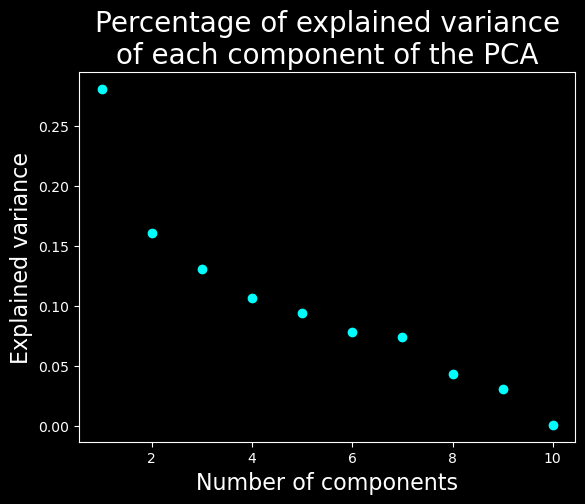

In [10]:
# find the dimensionality of the data
with plt.style.context("dark_background"):
    pca = PCA(n_components=X.shape[1])
    pca.fit(X)
    # plot the explained variance
    plt.scatter(range(1, X.shape[1] + 1), pca.explained_variance_ratio_, c="cyan")
    plt.xlabel("Number of components", fontsize=16)
    plt.ylabel("Explained variance", fontsize=16)
    plt.title("Percentage of explained variance\nof each component of the PCA", fontsize=20)
    plt.savefig(FIG_PATH / "pca_explained_variance.png", transparent=True)
    plt.show()

We will keep only the 7 first dimensions

## Clustering

We will cluster the data using Leiden with a resolution parameter of 0.2 and a PCA with 7 compenents.

In [11]:
#fix seed for reproducibility
np.random.seed(2)
clustering = LeidenClustering(
    leiden_kws={"n_iterations": -1, "seed": 0, "resolution_parameter": 0.2},
    pca_kws={"n_components": 7},
)
clustering.fit(X)
print(np.unique(clustering.labels_))


[0 1 2 3 4]


## Visualization of the results

In [12]:
# UMAP
umap = UMAP.UMAP(n_components=3, metric="euclidean")
result_umap_euc = umap.fit_transform(X)

### UMAP plot

In [13]:
fig = px.scatter_3d(
    result_umap_euc,
    x=0,
    y=1,
    z=2,
    color=clustering.labels_.astype(str),
    title="UMAP, showing Leiden clustering",
    # reduce size points
    size_max=0.1,
    category_orders={"color": [str(i) for i in range(0, len(np.unique(clustering.labels_)))]},
)
fig.update_layout({"plot_bgcolor": "#14181e", "paper_bgcolor": "#14181e"})
fig.update_layout(font_color="white")
fig.update_layout(scene=dict(xaxis=dict(showticklabels=False), yaxis=dict(showticklabels=False), zaxis=dict(showticklabels=False)))
fig.update_layout(legend_title_text="Cluster")
fig.update_layout(legend = dict(bgcolor = 'rgba(0,0,0,0)'))
fig.update_layout(scene=dict(xaxis_title="UMAP 1", yaxis_title="UMAP 2", zaxis_title="UMAP 3"))
fig.update_layout(scene = dict(
    xaxis = dict(
            backgroundcolor="rgba(0, 0, 0,0)",
            # gridcolor="rgba(0, 0, 0,0)", # gridcolor is for logo
            showbackground=True,
            zerolinecolor="white",),
    yaxis = dict(
        backgroundcolor="rgba(0, 0, 0,0)",
        # gridcolor="rgba(0, 0, 0,0)",
        showbackground=True,
        zerolinecolor="white"),
    zaxis = dict(
        backgroundcolor="rgba(0, 0, 0,0)",
        # gridcolor="rgba(0, 0, 0,0)",
        showbackground=True,
        zerolinecolor="white",),),
)

fig.write_html(FIG_PATH / "umap_leiden.html")
display(fig)

We can see that this algorithm does not find the same cluster as the UMAP and it is a good thing ! You can have a look at the notebook optics_DBSCAN if you want to see why...

### Features distributions in the clusters

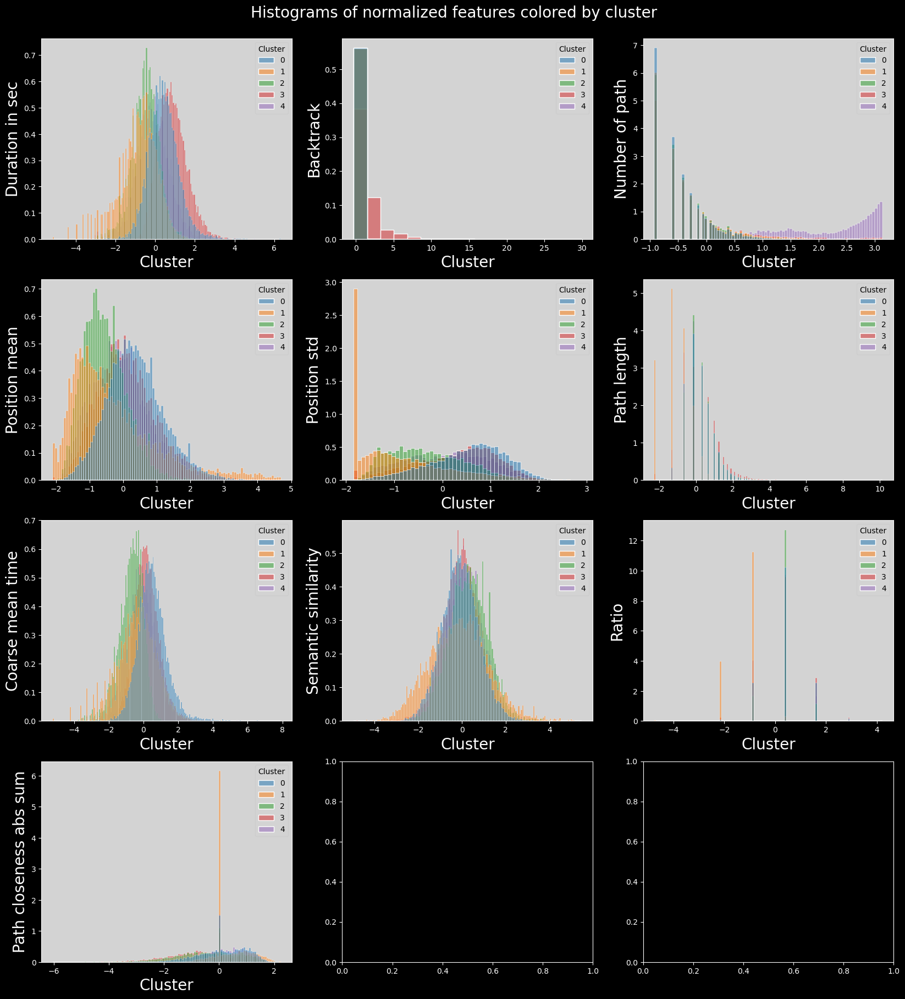

In [14]:
# plot histogram features colored by cluster
# plot_data = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING].copy().dropna()
# plot_data["cluster"] = clustering.labels_
# plot_data["cluster"] = plot_data["cluster"].astype("category")
# n_features = len(plot_data.columns) - 1
# n_cols = 5
# n_rows = int(np.ceil(n_features / n_cols))
# fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 10))
# axs = axs.flatten()
# for i, col in enumerate(plot_data.columns):
#     if col == "cluster":
#         continue
#     sns.histplot(
#         data=plot_data,
#         x=col,
#         hue="cluster",
#         ax=axs[i],
#         stat="density",
#         common_norm=False,
#     )
# plt.suptitle("Histograms of normalized features colored by cluster")
# plt.subplots_adjust(top=0.95)
# plt.savefig(FIG_PATH / "histograms_features_colored_by_cluster.png", transparent=True)
# plt.show()
# save_folder = FIG_PATH / "histogramms_colored_by_cluster"
# if not save_folder.exists():
#     save_folder.mkdir(parents=True)
# # save the same histograms but in separated images
# for i, col in enumerate(plot_data.columns):
#     if col == "cluster":
#         continue
#     fig, ax = plt.subplots(figsize=(8, 6))
#     sns.histplot(
#         data=plot_data,
#         x=col,
#         hue="cluster",
#         ax=ax,
#         stat="density",
#         common_norm=False,
#     ).set(title=col, xlabel=None, ylabel=None)
#     plt.savefig(save_folder / f"{col}_histogram_colored_by_cluster.png", transparent=True)
#     plt.close()
# plot histogram features colored by cluster
with plt.style.context("dark_background"):
    plot_data = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING].copy().dropna()
    plot_data["cluster"] = clustering.labels_
    plot_data["cluster"] = plot_data["cluster"].astype("category")
    n_features = len(plot_data.columns) - 1
    n_cols = 3
    n_rows = int(np.ceil(n_features / n_cols))
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 20))
    axs = axs.flatten()
    for i, col in enumerate(plot_data.columns):
        if col == "cluster":
            continue
        sns.histplot(
            data=plot_data,
            x=col,
            hue="cluster",
            ax=axs[i],
            stat="density",
            common_norm=False,
            palette="tab10",
        )
        utils.set_axis_style(axs, i)

    plt.suptitle("Histograms of normalized features colored by cluster", fontsize=20)
    plt.subplots_adjust(top=0.95)
    plt.show()

### Boxplots of features distribution

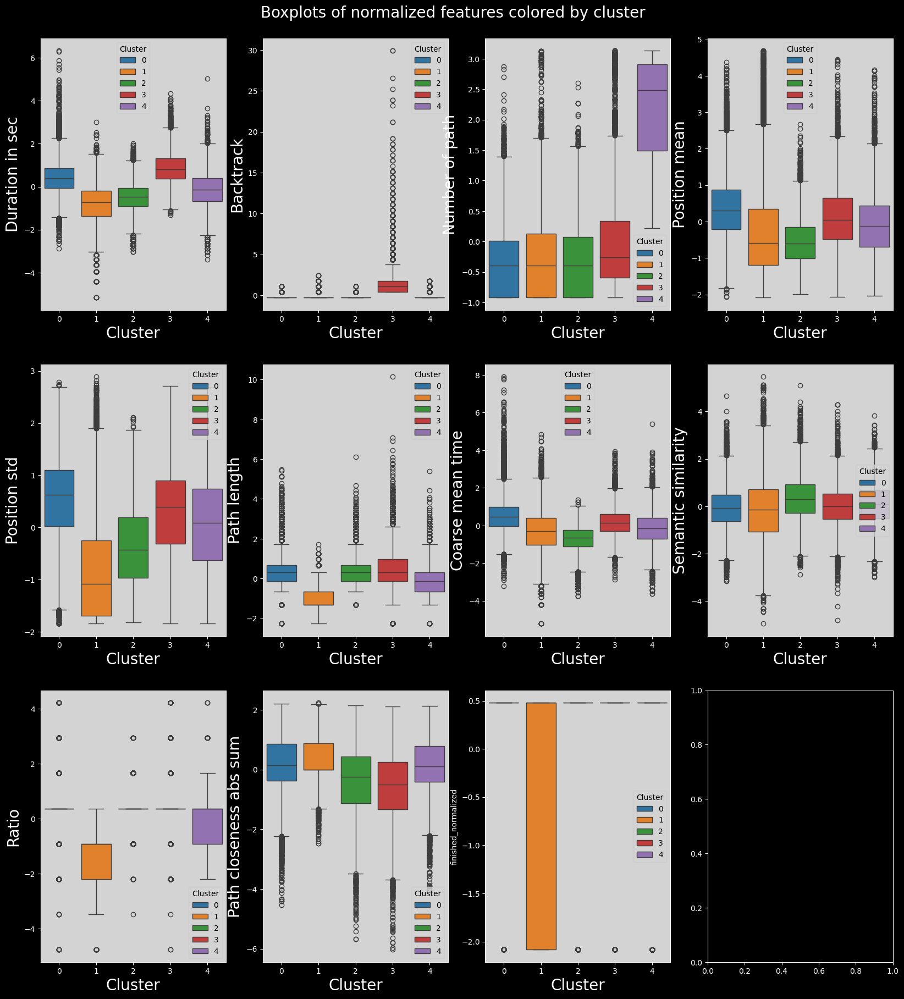

In [15]:
# plot the boxplots of features colored by cluster
# combined_df["finished_normalized"] = (
#     combined_df["finished"] - combined_df["finished"].mean()
# ) / combined_df["finished"].std()
# plot_data = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING + ["finished_normalized"]].copy()
# plot_data["cluster"] = clustering.labels_
# plot_data["cluster"] = plot_data["cluster"].astype("category")
# n_features = len(plot_data.columns) - 1
# n_cols = 4
# n_rows = int(np.ceil(n_features / n_cols))
# fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 20))
# fig.suptitle("Boxplots of normalized features colored by cluster")
# plt.subplots_adjust(top=0.95)
# axs = axs.flatten()
# for i, col in enumerate(plot_data.columns):
#     if col == "cluster":
#         continue
#     sns.boxplot(data=plot_data, x="cluster", y=col, ax=axs[i])
# plt.savefig(FIG_PATH / "boxplots_features_colored_by_cluster.png", transparent=True)
# plt.show()
# # save the same boxplots but in separated images
# save_folder = FIG_PATH / "boxplots_colored_by_cluster"
# if not save_folder.exists():
#     save_folder.mkdir(parents=True)
# for i, col in enumerate(plot_data.columns):
#     if col == "cluster":
#         continue
#     fig, ax = plt.subplots(figsize=(8, 6))
#     sns.boxplot(data=plot_data, x="cluster", y=col, ax=ax).set(title=col, xlabel=None, ylabel=None)
#     plt.savefig(save_folder / f"{col}_boxplot_colored_by_cluster.png", transparent=True)
#     plt.close()
with plt.style.context("dark_background"):
    combined_df["finished_normalized"] = (
        combined_df["finished"] - combined_df["finished"].mean()
    ) / combined_df["finished"].std()
    plot_data = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING + ["finished_normalized"]].copy()
    plot_data["cluster"] = clustering.labels_
    plot_data["cluster"] = plot_data["cluster"].astype("category")
    n_features = len(plot_data.columns) - 1
    n_cols = 4
    n_rows = int(np.ceil(n_features / n_cols))
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 20))
    fig.suptitle("Boxplots of normalized features colored by cluster", fontsize=20)
    plt.subplots_adjust(top=0.95)
    axs = axs.flatten()
    for i, col in enumerate(plot_data.columns):
        if col == "cluster":
            continue
        sns.boxplot(data=plot_data, x="cluster", y=col, ax=axs[i], hue="cluster", palette="tab10")
        utils.set_axis_style(axs, i)
    plt.show()

### Heatmap of features means in each cluster

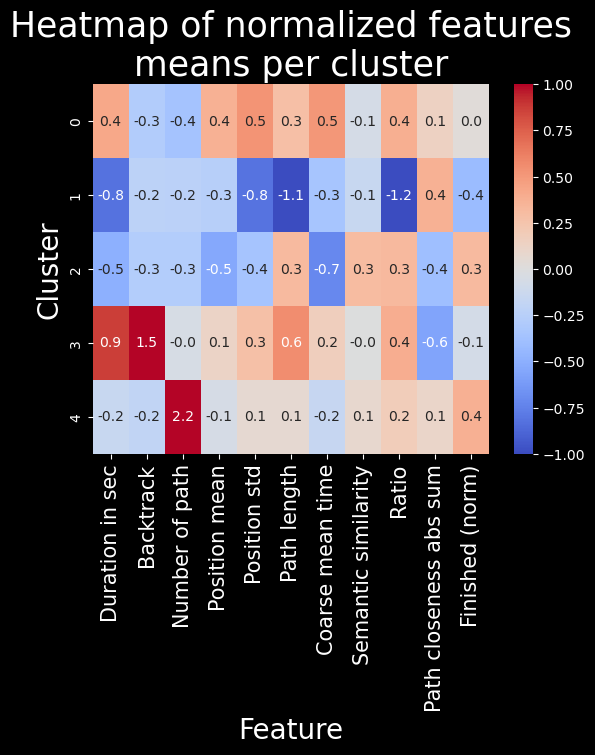

In [16]:
# # heatmap of features means per cluster
# means = plot_data.groupby(plot_data["cluster"]).mean()
# sns.heatmap(means, cmap="coolwarm", annot=True, fmt=".1f", vmin=-1, vmax=1)
# plt.title("Heatmap of normalized features means per cluster")
# plt.savefig(FIG_PATH / "heatmap_features_means_per_cluster.png", transparent=True, bbox_inches="tight")
# plt.show()
# heatmap of features means per cluster
feat_labels = utils.get_feature_names_labels()
with plt.style.context("dark_background"):
    means = plot_data.groupby(plot_data["cluster"]).mean()
    sns.heatmap(means, cmap="coolwarm", annot=True, fmt=".1f", vmin=-1, vmax=1)
    plt.title("Heatmap of normalized features\nmeans per cluster", fontsize=25)
    plt.ylabel("Cluster", fontsize=20)
    plt.xlabel("Feature", fontsize=20)
    plt.xticks(labels=feat_labels+["Finished (norm)"], ticks=np.arange(len(feat_labels)+1)+0.5, rotation=90, fontsize=15)
    plt.show()

### Number of paths per cluster

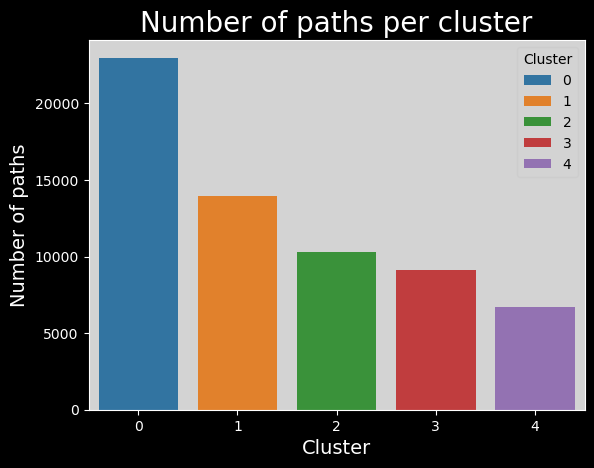

In [17]:
# clusters_names,n_points = np.unique(plot_data["cluster"], return_counts=True)
# sns.barplot(x=clusters_names, y=n_points).set_title("Number of paths per cluster")
# plt.savefig(FIG_PATH / "number_of_paths_per_cluster.png", transparent=True)
# plt.show()
clusters_names,n_points = np.unique(plot_data["cluster"], return_counts=True)
with plt.style.context("dark_background"):
    sns.barplot(x=clusters_names, y=n_points,hue=range(len(clusters_names)), palette="tab10").set_title("Number of paths per cluster", fontsize=20)
    # make background grey
    plt.gca().patch.set_facecolor("#d3d3d3")
    # update legend style
    leg = plt.gca().get_legend()
    leg.get_frame().set_facecolor("#d3d3d3")
    leg.set_title("Cluster")
    leg_title = leg.get_title()
    leg_title.set_color("black")
    # change all legend text to black
    [text.set_color("black") for text in leg.get_texts()]
    plt.xlabel("Cluster", fontsize=14)
    plt.ylabel("Number of paths", fontsize=14)
plt.show()

### Number of restarts per cluster

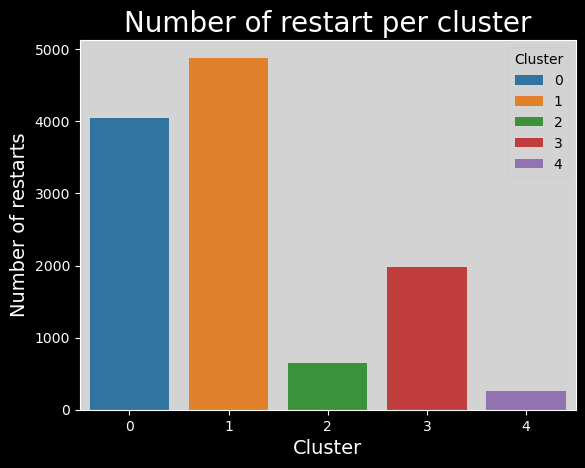

In [18]:
# # number of restarts per cluster
# plot_data["restart"] = combined_df["type"] == "restart"
# timeout_per_cluster = plot_data.groupby(plot_data["cluster"])["restart"].sum()
# sns.barplot(x=clusters_names, y=timeout_per_cluster).set_title(
#     "Number of restart per cluster"
# )
# plt.savefig(FIG_PATH / "number_of_restart_per_cluster.png", transparent=True)
# number of restarts per cluster
with plt.style.context("dark_background"):
    plot_data["restart"] = combined_df["type"] == "restart"
    timeout_per_cluster = plot_data.groupby(plot_data["cluster"])["restart"].sum()
    sns.barplot(x=clusters_names,
                y=timeout_per_cluster,
                hue=range(len(clusters_names)),
                palette="tab10",
                ).set_title(
        "Number of restart per cluster",
        fontsize=20
    )
    plt.gca().patch.set_facecolor("#d3d3d3")
    leg = plt.gca().get_legend()
    leg.get_frame().set_facecolor("#d3d3d3")
    leg.set_title("Cluster")
    leg_title = leg.get_title()
    leg_title.set_color("black")
    [text.set_color("black") for text in leg.get_texts()]
    plt.xlabel("Cluster", fontsize=14)
    plt.ylabel("Number of restarts", fontsize=14)
plt.show()

In [19]:
if not FILTER_TIMEOUT:
    # number of timeouts per cluster
    plot_data["timeout"] = combined_df["type"] == "timeout"
    timeout_per_cluster = plot_data.groupby(plot_data["cluster"])["timeout"].sum()
    sns.barplot(x=clusters_names, y=timeout_per_cluster).set_title(
        "Number of timeouts per cluster"
    )
    plt.savefig(FIG_PATH / "number_of_timeouts_per_cluster.png", transparent=True)

## Discussion

### Let's try to name and characterize these groups !
#### To do so, we will mainly use the heatmap and verify our claims using some t-tests (or Welch's t-test when the variances are too different)

- The slow ones (cluster 0):

The players contained in cluster 0 are very slow (with the second biggest durationInSec value among all clusters, 0.4, and the worst coarse_mean_time value, 0.5).
They do not backtrack, click links fairly low in the article (with the biggest position_mean feature mean across all clusters) but this varies (position_std = 0.5).
This habit of searching for links further down on the article page might in part explain the slowness of these players.
They also have a high ratio, one that is amongst the worst (ratio = 0.4).
- The bosses (cluster 1):

The players contained in cluster 1 are very fast (durationInSec = -0.8), they click on fairly high-position links most times (position_mean = -0.3 and position_std = -0.8)
Their path length and ratio are top of the list, with path_length = -1.1 and ratio = -1.2.
This seemed suspicious at first: we thought their low ratio was due to them not finishing most of their games and therefore creating unrealistically short paths.
This however is not such a prominent bias, as the unfinished portion of games in this cluster is actually only of 1/3.
Moreover, the path_closeness_abs_sum feature confirms that this cluster's players play very well: they reach hubs fast, with a path_closeness_abs_sum of 0.4, and the biggest one among clusters.
Overall this cluster seems to contain either the "boss" players, or players that try one game quickly and don't finish it.
- The cautious ones (cluster 2):

The players contained in cluster 2 are fast (durationInSec = -0.5, coarse_mean_time = -0.7), they do not backtrack, and click on early links (position_mean = -0.5) most times (position_std = -0.4).
They finish most times (finished_normalized = 0.3) but do not do so with a good ratio (ratio = 0.3), and they do not have a high path_closeness_abs_sum.
When looking closer at samples from this cluster, they seem to at first reach hubs fast but then to slowly and cautiously go back down (which explains the low path_closeness_abs_sum), most likely to be sure to reach their target.
Players from cluster 2 have a good intuition but are afraid to get lost.
- The lost ones (cluster 3):

The players contained in cluster 3 are very slow overall (durationInSec = 0.9), but not so much on the average time they spend on a page (coarse_mean_time = 0.2).
This is explained by the fact that they backtrack VERY frequently (backtrack = 1.5).
They also have the longest paths (path_length = 0.6), and this is not due to the backtrack as path _length is computed without considering backtracks.
This shows how backtracking isn't necessarly going to improve player performance.
Players here also do not reach hubs easily, with the worst path_closeness_abs_sum value, -0.6; and they have an overall poor ratio (ratio = 0.4).
All in all, these players seem to have good intentious and to be meticoulous in their search of the next path, but without success. They just end up getting lost.
- The experienced ones (cluster 4):

The players contained in cluster 4 are fairly fast (durationInSec = -0.2), and do not backtrack much (backtrack = -0.2).
They have played a lot of games before (numberOfPath = 2.2), and finish a big portion of their games (with the biggest finished_normalized value across clusters, 0.4).
They perform fairly, but not extraordinarily well (ratio = 0.2 and path_closeness_abs_sum = 0.1).
They simply are experienced and able to easily finish their game.

### Statistical analysis
Here is the statisticall analysis to verify our claims. As expected, due to the large sample size, they are all true, but the effect size is not always very important. However, there is always at least one feature in each cluster were the |d'| is higher than 0.3 indicating a small effect size, and it can range up to 1.1 indicating a very large effect size !

In [64]:
# add the clusters to combined_df
combined_df["cluster"] = clustering.labels_
# test the hypothesis cluster, on feature, is greater (>) or lower (<) than the other
hypotheses = [(0,"durationInSec",">"),(0,"coarse_mean_time",">"),(0,"ratio",">"),
              (1,"durationInSec","<"),(1,"path_length","<"),(1,"ratio","<"),(1,"path_closeness_abs_sum",">"),
              (2,"durationInSec","<"),(2,"coarse_mean_time","<"),(2,"position_mean","<"),(2,"position_std","<"),(2,"ratio",">"),
              (3,"durationInSec",">"),(3,"backtrack",">"),(3,"path_length",">"),(3,"path_closeness_abs_sum","<"),(3,"ratio",">"),
              (4,"durationInSec","<"),(4,"backtrack","<"),(4,"numberOfPath",">"),(4,"path_closeness_abs_sum",">")]
utils.print_test_means_differences(hypotheses,combined_df)

Cluster 0 has a greater mean of durationInSec            , p-value=0.0,	 effect size=0.34
Cluster 0 has a greater mean of coarse_mean_time         , p-value=0.0,	 effect size=0.422
Cluster 0 has a greater mean of ratio                    , p-value=0.0,	 effect size=0.308
Cluster 1 has a smaller mean of durationInSec            , p-value=0.0,	 effect size=-0.492
Cluster 1 has a smaller mean of path_length              , p-value=0.0,	 effect size=-0.713
Cluster 1 has a smaller mean of ratio                    , p-value=0.0,	 effect size=-0.865
Cluster 1 has a greater mean of path_closeness_abs_sum   , p-value=0.0,	 effect size=0.203
Cluster 2 has a smaller mean of durationInSec            , p-value=0.0,	 effect size=-0.226
Cluster 2 has a smaller mean of coarse_mean_time         , p-value=0.0,	 effect size=-0.334
Cluster 2 has a smaller mean of position_mean            , p-value=0.0,	 effect size=-0.248
Cluster 2 has a smaller mean of position_std             , p-value=0.0,	 effect size=

### Let's look at some paths that were run at least one person of each group

#### Add the backtracks back to the dataset to display the true path followed by the players

In [21]:
paths_finished = pd.read_csv(
    DATA_PATH / "wikispeedia_paths-and-graph/paths_finished.tsv",
    sep="\t",
    header=None,
    names=["hashedIpAddress", "timestamp", "durationInSec", "path", "rating"],
    encoding="utf-8",
    skiprows=16,
).copy(deep=True)
# we will merge on timestamp and hashedIpAddress, reason why we need to convert timestamp to datetime and drop duplicates
paths_finished["timestamp"] = pd.to_datetime(paths_finished["timestamp"], unit="s", utc=True)
paths_finished = paths_finished[['hashedIpAddress', 'timestamp', 'path']].copy(deep=True)
paths_finished.drop_duplicates(subset=["timestamp", "hashedIpAddress"], inplace=True)
# prepare combined_df to merge with paths_finished, by converting timestamp to datetime, dropping duplicates and keeping only finished paths
finished_df = combined_df[combined_df["finished"] == 1].copy(deep=True)
finished_df["timestamp"] = pd.to_datetime(finished_df["timestamp"], utc=True)
finished_df.drop_duplicates(subset=["timestamp", "hashedIpAddress"], inplace=True)
# merge finished_df with paths_finished, we will have a column named path_with_backtrack
finished_df=finished_df.merge(paths_finished, on=["hashedIpAddress","timestamp"], how="left", suffixes=("_without_backtrack", "_with_backtrack"))

Do these paths even exist ?

In [22]:
finished_df["start->end"] = finished_df["path_with_backtrack"].apply(lambda x: (x.split(";")[0] + "->" + x.split(";")[-1]))
n_clusters_per_path=finished_df.groupby("start->end")["cluster"].nunique().sort_values(ascending=False)
n_clusters_per_path[n_clusters_per_path==5].index

Index(['Stuttering->Water', 'Manchester->Water',
       'Arnold_Schwarzenegger->Vegetable', 'Electricity->God',
       'Automobile->Pluto', 'Winter->Buenos_Aires', 'Dog->Sea',
       'Alternative_rock->Milk', 'Dog->Telephone', 'Planet->Nuclear_power',
       'Italian_Renaissance->Forest', 'AIDS->Jesus', 'Tennis->Nuclear_weapon',
       'Quantum_mechanics->Clay',
       'Geology_of_the_Grand_Canyon_area->Vegetable', 'Bird->Thomas_Jefferson',
       'Bird->Adolf_Hitler', 'Isaac_Newton->Latin_America', 'Asteroid->Viking',
       'Linux->Adolf_Hitler', 'Beer->Sun', 'Achilles->Winston_Churchill',
       'Computer->Russia', 'Beer->Warsaw', 'Honduras->Tripoli',
       'Jesus->Football', 'Acid_rain->Economics', 'Turkmenistan->Music',
       'Cat->Computer', 'Flower->Kazakhstan', 'Google->God',
       'Antlion->Hip_hop_music'],
      dtype='object', name='start->end')

Yes! Let's dive into Google to God (because it's a funny one)

In [23]:
pd.set_option('max_colwidth', 400)
paths=finished_df[finished_df["start->end"]=="Google->God"][["cluster", "path_with_backtrack"]].sort_values(by="cluster")
paths.groupby("cluster").head(5)

,cluster,path_with_backtrack
19263,0,Google;California;Arnold_Schwarzenegger;George_W._Bush;Religion;God
19265,0,Google;Fiction;Greek_mythology;Deity;God
19266,0,Google;Internet;Tim_Berners-Lee;Elizabeth_II_of_the_United_Kingdom;British_monarchy;Roman_Catholic_Church;God
19269,0,Google;United_States;Judaism;Names_of_God_in_Judaism;God
19271,0,Google;United_States;Judaism;Christianity;Jesus;God
19267,1,Google;Germany;Atheism;God
19270,1,Google;Fiction;Religion;God
19268,2,Google;Fiction;Religion;Christianity;Jesus;Bible;Names_of_God_in_Judaism;God
19273,3,Google;United_States;<;United_States;Manifest_Destiny;<;United_States_Declaration_of_Independence;<;Latin;Rome;<;Roman_Catholic_Church;God
19264,4,Google;United_States;Judaism;Names_of_God_in_Judaism;God
